# Klasyfikacja binarna grzybów - trujący czy nie

## Opis

Zbiór do klasyfikacji zawierar tabelę z 9-cioma kolumnami:
* Cap Diameter - Średnica kapelusza
* Cap Shape - Kształt kapelusza
* Gill Attachment - Mocowanie skrzeli grzybowych
* Gill Color - Kolor skrzeli grzybowych
* Stem Height - Wysokość łodygi
* Stem Width - Szerokosć łodyki
* Stem Color - Kolor łodygi
* Season - Sezon
* Target Class - Jadalne (0) czy trujące (1)

## Importy

In [202]:
import csv
import pandas as pd
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix
%matplotlib inline
import matplotlib.pyplot as plt
import plotly.express as px

import plotly.offline as pyo
pyo.init_notebook_mode()

## Wyświetlenie danych

In [203]:
#Wczytanie zbioru danych
df = pd.read_csv("Kaggle_DataSet/mushroom_cleaned.csv")

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54035 entries, 0 to 54034
Data columns (total 9 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   cap-diameter     54035 non-null  int64  
 1   cap-shape        54035 non-null  int64  
 2   gill-attachment  54035 non-null  int64  
 3   gill-color       54035 non-null  int64  
 4   stem-height      54035 non-null  float64
 5   stem-width       54035 non-null  int64  
 6   stem-color       54035 non-null  int64  
 7   season           54035 non-null  float64
 8   class            54035 non-null  int64  
dtypes: float64(2), int64(7)
memory usage: 3.7 MB


Opis danych:
* Ich ilość
* Wartość oczekiwana
* Odchylenie standardowe
* Minimalną wartość
* Pierwszy kwartyl (poniżej tej wartości znajduje się 25% danych)
* Mediana
* Trzeci kwartyl (poniżej tej wartości znajduje się 75% danych)
* Maksymalną wartość

In [204]:
df.describe()

,cap-diameter,cap-shape,gill-attachment,gill-color,stem-height,stem-width,stem-color,season,class
count,54035.000000,54035.000000,54035.000000,54035.000000,54035.000000,54035.000000,54035.000000,54035.000000,54035.000000
mean,567.257204,4.000315,2.142056,7.329509,0.759110,1051.081299,8.418062,0.952163,0.549181
std,359.883763,2.160505,2.228821,3.200266,0.650969,782.056076,3.262078,0.305594,0.497580
min,0.000000,0.000000,0.000000,0.000000,0.000426,0.000000,0.000000,0.027372,0.000000
25%,289.000000,2.000000,0.000000,5.000000,0.270997,421.000000,6.000000,0.888450,0.000000
50%,525.000000,5.000000,1.000000,8.000000,0.593295,923.000000,11.000000,0.943195,1.000000
75%,781.000000,6.000000,4.000000,10.000000,1.054858,1523.000000,11.000000,0.943195,1.000000
max,1891.000000,6.000000,6.000000,11.000000,3.835320,3569.000000,12.000000,1.804273,1.000000


## Sprawdzenie "Równości" klas wyjściowych

Sprawdzenie czy ilość grzybów trujących i jadalnych w zbiorze danych jest podobna.

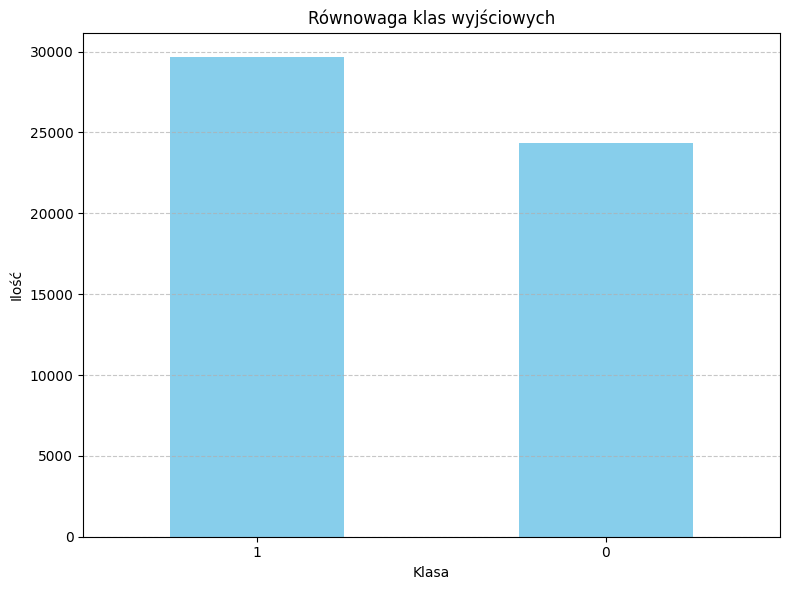

In [205]:
from turtle import color


target_column = 'class'

target_balance = df[target_column].value_counts()

plt.figure(figsize=(8,6))
target_balance.plot(kind='bar',color='skyblue')
plt.title("Równowaga klas wyjściowych")
plt.xlabel('Klasa')
plt.ylabel('Ilość')
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


## Sprawdzanie czy występują puste pola

Jeśli w zbiorze danych wystąpi jakaś wartość null, poniższa funkcja sprawdzi w której cesze się znajduje i zliczy ich wystąpienia.

In [206]:
df.isnull().sum()

cap-diameter       0
cap-shape          0
gill-attachment    0
gill-color         0
stem-height        0
stem-width         0
stem-color         0
season             0
class              0
dtype: int64

## Macierz korelacji

Funkcja ta wygeneruje macierz korelacji dla wszystkich cech.

<Axes: >

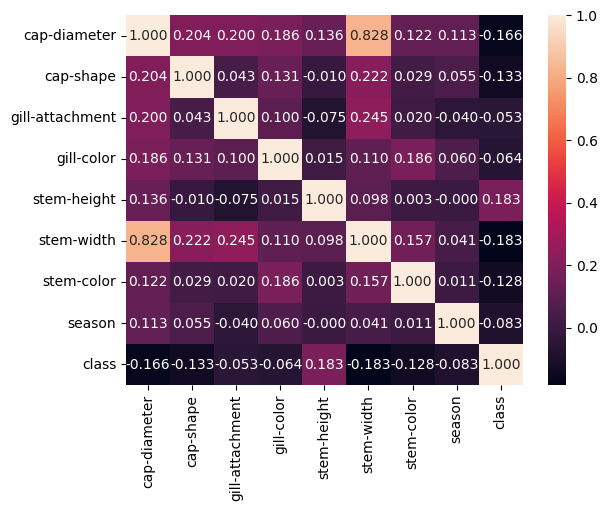

In [207]:
sns.heatmap(df.corr(), annot=True, fmt=".3f")

Można zaobserwoać że średnica kapelusza (cap-diameter) jest mocno skorelowana z szerokością nóżki (stem-width), można by więc pozbyć się jednej z tych cech. 
Widać również że sposób mocowania blaszek (gill-attachment) jest powiązany z szerokością nóżki (stem-width).

In [208]:
corr_matrix=df.corr()
corr_matrix["class"].sort_values(ascending=False)

class              1.000000
stem-height        0.183354
gill-attachment   -0.052541
gill-color        -0.063947
season            -0.082919
stem-color        -0.128339
cap-shape         -0.133338
cap-diameter      -0.165676
stem-width        -0.182856
Name: class, dtype: float64

## Wykresy pudełkowe
Pudełko reprezentuje punkty między pierwszym a  trzecim kwartylem, czyli 50% populacji.
Wąsy z obu boków pudełka przedstawiają minimum oraz maximum,
natomiast pionowa linia w pudełku to mediana. 

In [209]:
# df.columns
columns = df.columns
#usuwa kolumnę Class
columns = columns[:-1]
figs = []

for column in columns:
    fig = px.box(df,
        x=column,
        title=f'Wykres pudełkowy kolumny: {column}')
    figs.append(fig)

for fig in figs:
    fig.show()

## Podział danych

Zbiór danych podzielono na zbiory:
* Uczący (train)
* Walidujący (val)
* Testujący (test)

In [210]:
from sklearn.preprocessing import StandardScaler

std = StandardScaler()

X = df.drop('class', axis='columns')
Y = df['class']

x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=11)
x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size=0.25, random_state=11)

X_train = std.fit_transform(x_train)
X_test = std.transform(x_test)
X_val = std.transform(x_val)

## Random Forecast

Random Forest Classifier to metoda klasyfikacji wykorzystującą wiele drzew decyzyjnych do podejmowania decyzji. Jej główne cechy to:
* Jest to metoda zespołowa, czyli łączy wyniki wielu modeli (tutaj drzew decyzyjnych) w celu poprawy wydajności klasyfikacji
* Składa się z wielu drzew, gdzie każde drzewo jest trenowane na losowym podzbiorze danych treningowych. Wiele drzew jest nazywane lasem.
* Każde drzewo decyzyjne w lesie oddaje głos na jedną z klas. Finalna decyzja klasyfikatora jest podejmowana na podstawie większości głosów.
* Dzięki losowości w wyborze danych i cech, Random Forest jest mniej podatny na przeuczenie w porównaniu do pojedynczych drzew decyzyjnych.

In [211]:
model = RandomForestClassifier(n_estimators=200)
model.fit(x_train,y_train)

RandomForestClassifier(n_estimators=200)

## Ewaluacja modelu

Sprawdzenie modelu na danych uczących (powinno dać 1)

In [212]:
model.score(x_train, y_train)

1.0

Sprawdzenie modelu na danych validacyjnych (jaką część danych rozpozna)

In [213]:
model.score(x_val, y_val)

0.9876931618395485

In [214]:
model.feature_importances_

array([0.12861275, 0.09406526, 0.1467909 , 0.1239981 , 0.12401511,
       0.22067602, 0.12490262, 0.03693925])

Sprawdzenie modelu na danych testowych (jaką część danych rozpozna)

In [215]:
model.score(x_test, y_test)

0.9895438141945035

In [216]:
y_predicted = model.predict(x_test)

cm = confusion_matrix(y_test,y_predicted)
cm


array([[4767,   47],
       [  66, 5927]], dtype=int64)

Text(95.72222222222221, 0.5, 'Prawdziwe')

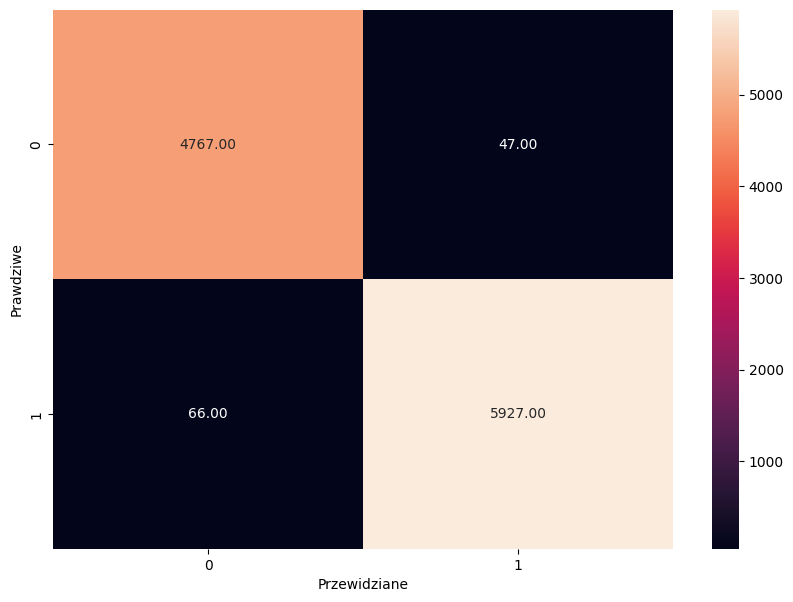

In [220]:
plt.figure(figsize=(10,7))
sns.heatmap(cm,annot=True, fmt=".2f")
plt.xlabel('Przewidziane')
plt.ylabel('Prawdziwe')

Analizując powyższą macierz korelacji, widzimy że:
* 4767 grzybów jadalnych zostało poprawnie sklasyfikowanych
* 5927 grzybów trujących zostało poprawnie sklasyfikowanych
* 66 grzybów trujących zostało sklasyfikowanych jako jadalne
* 47 grzybów jadalnych zostało sklasyfikowanych jako grzyby trujące

## Y_test vs Y_pred

In [218]:
result_df = pd.DataFrame({'Prawdziwe': y_test, 'Przewidziane':y_predicted})
print(result_df)



       Prawdziwe  Przewidziane
627            1             1
6956           1             1
337            1             1
16521          0             0
27576          1             1
...          ...           ...
30492          0             0
49087          0             0
2314           0             0
42356          1             1
35365          1             1

[10807 rows x 2 columns]


Zapis do pliku csv

In [219]:
# Print the DataFrame to a CSV file
result_df.to_csv('Wyniki_Klasyfikacji.csv', index=False)

print("result_df zapisany do  resulWyniki_Klasyfikacji.csv")


result_df zapisany do  resulWyniki_Klasyfikacji.csv
